# Topic Modelling using LDA

In [1]:
# Importing the necessary libraries
import nltk  # Natural Language Toolkit for text processing
import pandas as pd  # Data manipulation and analysis
import re  # Regular expressions for text cleaning
from nltk.corpus import stopwords  # Stopwords for text preprocessing
from nltk.tokenize import word_tokenize  # Tokenization of words
from nltk.stem import PorterStemmer  # Stemming for word normalization
from nltk.stem import WordNetLemmatizer  # Lemmatization for word normalization
import string  # String manipulation and processing
import gensim  # Gensim library for topic modeling
from gensim import corpora, models  # Gensim modules for topic modeling
import pyLDAvis.gensim  # Interactive visualization for LDA topics
from tqdm import tqdm  # Progress bar for tracking task completion
from gensim.models.callbacks import CallbackAny2Vec  # Callbacks for Gensim model training

In [2]:
# Initialize NLTK
nltk.download('punkt')
nltk.download('stopwords')
nltk.download('wordnet')

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.
[nltk_data] Downloading package wordnet to /root/nltk_data...


True

In [3]:
!pip install pyLDAvis

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.6/2.6 MB 13.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 18.2/18.2 MB 23.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.7/12.7 MB 52.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 341.8/341.8 kB 26.7 MB/s eta 0:00:00
  Attempting uninstall: numpy
    Found existing installation: numpy 1.23.5
    Uninstalling numpy-1.23.5:
      Successfully uninstalled numpy-1.23.5
  Attempting uninstall: pandas
    Found existing installation: pandas 1.5.3
    Uninstalling pandas-1.5.3:
      Successfully uninstalled pandas-1.5.3
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
google-colab 1.0.0 requires pandas==1.5.3, but you have pandas 2.1.0 which is incompatible.
numba 0.56.4 requires numpy<1.24,>=1.18, but you have numpy 1.25.2 which is incompatible.
tensorflow 2.13.0 

In [ ]:
!pip install tqdm

In [5]:
df = pd.read_excel("Whatisloneliness060321.xlsx")

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [6]:
import warnings
warnings.filterwarnings("ignore", category=DeprecationWarning)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [7]:
df_orig = df
df = df.rename(columns={'Q9_Loneliness_Meaning_Qual': 'survey'})

In [8]:
import pandas as pd
import spacy
from nltk.tokenize import word_tokenize
from nltk.util import bigrams, trigrams
from nltk.corpus import stopwords

# Load the Spacy model
nlp = spacy.load('en_core_web_sm')

# Cleaning function
def clean_text(df, column_name='survey'):
    df['clean_text'] = df[column_name].astype(str).str.lower()
    df['clean_text'] = df['clean_text'].str.replace(r'\d+|-', '', regex=True)
    df['clean_text'] = df['clean_text'].str.replace(r'[^\w\s]', '', regex=True)
    return df

# Define lemmatization function using Spacy
def spacy_lemmatize(text):
    doc = nlp(text)
    return " ".join([token.lemma_ for token in doc])

# Remove stopwords
#stopwords_list = set(stopwords.words('english'))

# Add additional stopwords
additional_stopwords = ['solitude', 'isolation', 'seclusion', 'desolation', 'abandonment',
                       'emptiness', 'alienation', 'forsakenness', 'aloneness', 'withdrawal',
                       'loneliness', 'lonely','alone','isolated','noone','anyone','someone','one','talk']

#stopwords_list.update(additional_stopwords)

#def remove_stopwords(text):
 #   words = word_tokenize(text)
  #  return ' '.join([word for word in words if word not in stopwords_list])

def remove_stopwords(text):
    words = word_tokenize(text)
    return ' '.join([word for word in words if word not in additional_stopwords])

def get_bigrams(text):
    tokens = word_tokenize(text)
    return list(bigrams(tokens))

def get_trigrams(text):
    tokens = word_tokenize(text)
    return list(trigrams(tokens))

# Assuming your DataFrame is named 'df' and has a column 'survey':
df = clean_text(df)
df['lemmatized_text'] = df['clean_text'].apply(spacy_lemmatize)
df['without_stopwords'] = df['lemmatized_text'].apply(remove_stopwords)
df['bigrams'] = df['without_stopwords'].apply(get_bigrams)
df['trigrams'] = df['without_stopwords'].apply(get_trigrams)
df['trigrams_with_stopwords'] = df['lemmatized_text'].apply(get_trigrams)
# Drop missing values
df.dropna(inplace=True)

# Display DataFrame shape, head, and counts of missing values and empty strings
print(df.shape)
print(df.head())
print(df.isna().sum())
print((df == '').sum())

# Filter out rows with empty strings in specified columns
df = df[df['clean_text'] != '']
df = df[df['lemmatized_text'] != '']
df = df[df['without_stopwords'] != '']
df = df[df['bigrams'].astype(str) != '[]']
df = df[df['trigrams'].astype(str) != '[]']
df = df[df['trigrams_with_stopwords'].astype(str) != '[]']

(45625, 12)
   Idme  gender  groupedage   age  UCLA3itemscale  \
0   203     2.0         2.0  16.0             8.0   
1   237     2.0         2.0  16.0             9.0   
2   545     2.0         2.0  16.0             6.0   
3   565     1.0         2.0  16.0             8.0   
4   658     2.0         2.0  16.0             9.0   

                                              survey  \
0                                                -99   
1                                Makes me feel empty   
2  Not speaking to anyone for days. Being out wit...   
3  I am a very loving generous person but due to ...   
4                                         Unlikeable   

                                          clean_text  \
0                                                      
1                                makes me feel empty   
2  not speaking to anyone for days being out with...   
3  i am a very loving generous person but due to ...   
4                                         unlikeable

In [9]:
!pip install pyLDAvis

In [10]:
# Assuming df is your dataframe with a column 'text_preprocessed'
documents = df['trigrams'].tolist()

In [11]:
# Convert tuple ngrams to string format
tokenized_docs = [['_'.join(word) if isinstance(word, tuple) else word for word in doc] for doc in documents]

# Create a dictionary representation of the documents
dictionary = corpora.Dictionary(tokenized_docs)

In [12]:
# Convert the documents into a document-term matrix
doc_term_matrix = [dictionary.doc2bow(doc) for doc in tokenized_docs]

In [15]:
# Define a custom callback class for tracking training progress using tqdm
class LdaTqdmCallback(CallbackAny2Vec):
    def __init__(self, num_passes):
        """
        Initialize the callback.

        Args:
            num_passes (int): The total number of training passes (epochs).
        """
        self.epoch = 0  # Initialize the epoch counter
        self.progress_bar = tqdm(total=num_passes, desc="Epoch")  # Create a tqdm progress bar

    def on_epoch_end(self, model):
        """
        Triggered at the end of each training epoch.

        Args:
            model: The Word2Vec or Doc2Vec model being trained.
        """
        self.epoch += 1  # Increment the epoch counter
        self.progress_bar.update(1)  # Update the tqdm progress bar

    def on_train_end(self, model):
        """
        Triggered at the end of the entire training process.

        Args:
            model: The Word2Vec or Doc2Vec model being trained.
        """
        self.progress_bar.close()  # Close the tqdm progress bar when training is complete

In [16]:
import gensim
from tqdm import tqdm

# Set the number of training passes (epochs)
num_passes = 10

# Create a tqdm progress bar to track training progress
progress_bar = tqdm(total=num_passes, desc="Training LDA")

# Initialize an LDA model with one pass
lda_model = gensim.models.LdaModel(id2word=dictionary, passes=1)

# Loop through the specified number of passes for training
for _ in range(num_passes):
    # Update the LDA model with the document-term matrix
    lda_model.update(doc_term_matrix)

    # Update the progress bar
    progress_bar.update(1)

# Close the progress bar when training is completed
progress_bar.close()

Training LDA: 100%|██████████| 10/10 [21:07<00:00, 126.80s/it]


In [17]:
num_topics_to_print = lda_model.num_topics  # Get the number of topics in the LDA model
topics = []  # Initialize an empty list to store the topics

# Loop through each topic for extraction and printing
for idx in range(num_topics_to_print):
    print(f"Extracting topic {idx + 1} of {num_topics_to_print}...")

    # Extract and print the top words in the current topic
    topic = lda_model.print_topics(num_topics=num_topics_to_print, num_words=10)[idx]

    # Append the topic to the 'topics' list
    topics.append(topic)

Extracting topic 1 of 100...
Extracting topic 2 of 100...
Extracting topic 3 of 100...
Extracting topic 4 of 100...
Extracting topic 5 of 100...
Extracting topic 6 of 100...
Extracting topic 7 of 100...
Extracting topic 8 of 100...
Extracting topic 9 of 100...
Extracting topic 10 of 100...
Extracting topic 11 of 100...
Extracting topic 12 of 100...
Extracting topic 13 of 100...
Extracting topic 14 of 100...
Extracting topic 15 of 100...
Extracting topic 16 of 100...
Extracting topic 17 of 100...
Extracting topic 18 of 100...
Extracting topic 19 of 100...
Extracting topic 20 of 100...
Extracting topic 21 of 100...
Extracting topic 22 of 100...
Extracting topic 23 of 100...
Extracting topic 24 of 100...
Extracting topic 25 of 100...
Extracting topic 26 of 100...
Extracting topic 27 of 100...
Extracting topic 28 of 100...
Extracting topic 29 of 100...
Extracting topic 30 of 100...
Extracting topic 31 of 100...
Extracting topic 32 of 100...
Extracting topic 33 of 100...
Extracting topic 34

In [18]:
# Assign meaningful labels to the identified topics based on dominant words
for topic in topics:
    print(topic)

(0, '0.141*"to_share_experience" + 0.097*"share_experience_with" + 0.073*"you_be_not" + 0.033*"your_life_with" + 0.031*"share_your_life" + 0.030*"to_share_your" + 0.030*"to_connect_to" + 0.026*"feel_able_to" + 0.023*"not_feel_able" + 0.020*"that_you_be"')
(1, '0.043*"be_separate_from" + 0.042*"we_do_not" + 0.040*"other_people_but" + 0.036*"separate_from_the" + 0.036*"or_do_not" + 0.033*"of_your_life" + 0.031*"be_exclude_from" + 0.026*"and_there_s" + 0.022*"but_you_can" + 0.021*"I_grow_up"')
(2, '0.335*"be_able_to" + 0.269*"not_be_able" + 0.101*"able_to_share" + 0.035*"and_not_be" + 0.030*"be_with_other" + 0.022*"able_to_to" + 0.015*"when_you_would" + 0.010*"able_to_have" + 0.009*"with_lack_of" + 0.008*"prefer_to_be"')
(3, '0.127*"to_confide_in" + 0.061*"not_have_friend" + 0.057*"with_have_no" + 0.042*"sense_of_be" + 0.041*"to_not_be" + 0.040*"I_think_be" + 0.035*"have_to_confide" + 0.034*"not_have_I" + 0.030*"have_I_can" + 0.024*"not_be_in"')
(4, '0.094*"of_the_time" + 0.059*"most_of_t

In [19]:
# Visualize the topics using pyLDAvis

# Enable pyLDAvis for Jupyter Notebook
pyLDAvis.enable_notebook()

# Prepare the visualization using the LDA model, document-term matrix, and dictionary
vis = pyLDAvis.gensim.prepare(lda_model, doc_term_matrix, dictionary)

# Display the pyLDAvis visualization in the notebook
pyLDAvis.display(vis)

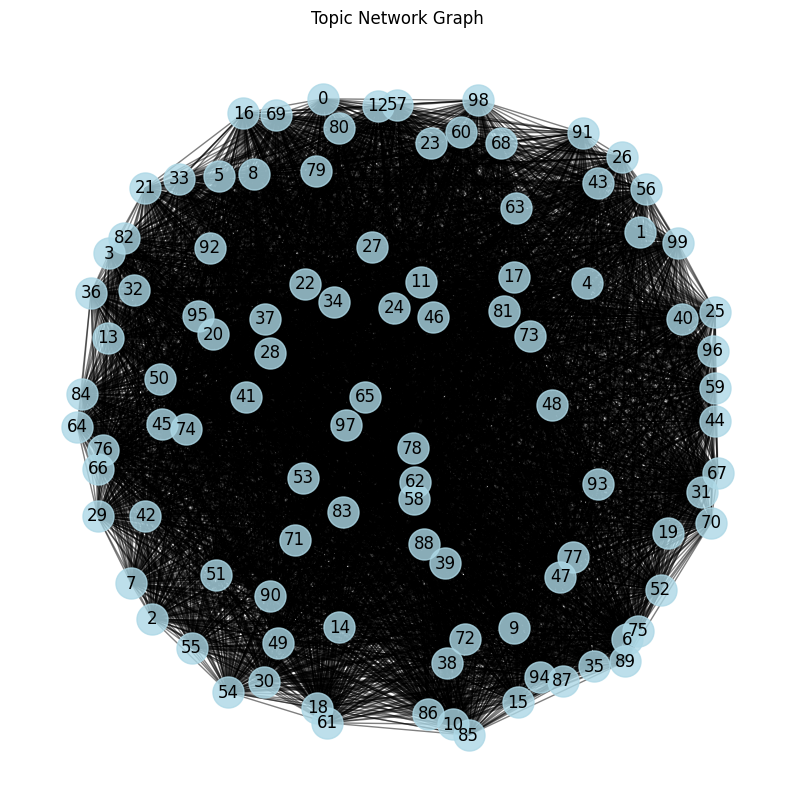

In [20]:
import networkx as nx
import matplotlib.pyplot as plt

# Function to plot topic network graph
def plot_topic_network(model):
    # Get the number of topics from the model
    num_topics = model.num_topics

    # Calculate topic co-occurrence matrix and normalize it
    topic_cooccurrence = model.state.get_lambda()
    topic_cooccurrence /= topic_cooccurrence.sum(axis=1)[:, None]

    # Calculate topic similarity based on co-occurrence
    topic_similarity = topic_cooccurrence @ topic_cooccurrence.T

    # Create an empty graph
    G = nx.Graph()

    # Add nodes to the graph, one for each topic
    for i in range(num_topics):
        G.add_node(i)

    # Add edges between topics based on their similarity
    for i in range(num_topics):
        for j in range(i + 1, num_topics):
            similarity = topic_similarity[i, j]
            if similarity > 0:
                G.add_edge(i, j, weight=similarity)

    # Define positions for nodes using a spring layout
    pos = nx.spring_layout(G, seed=42)

    # Create a plot for the topic network graph
    plt.figure(figsize=(10, 10))
    nx.draw_networkx_nodes(G, pos, node_color='lightblue', node_size=500, alpha=0.8)
    nx.draw_networkx_edges(G, pos, width=1.0, alpha=0.5)
    nx.draw_networkx_labels(G, pos, font_size=12, font_color='black')
    plt.axis('off')
    plt.title('Topic Network Graph')
    plt.show()

# Call the function to plot the topic network graph using the LDA model
plot_topic_network(lda_model)

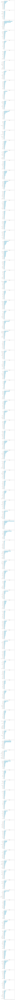

In [21]:
import matplotlib.pyplot as plt

# Function to plot top words for each topic
def plot_top_words(model, num_words=10):
    # Get the number of topics from the model
    num_topics = model.num_topics

    # Create subplots for each topic
    fig, axs = plt.subplots(num_topics, 1, figsize=(8, num_topics*5), sharex=True)

    for topic_num in range(num_topics):
        # Get the top words for the current topic
        top_words = model.show_topic(topic_num, num_words)
        top_words = dict(top_words)

        # Create a horizontal bar plot for the top words
        axs[topic_num].barh(range(num_words), list(top_words.values()), align='center', color='lightblue')
        axs[topic_num].set_yticks(range(num_words))
        axs[topic_num].set_yticklabels(top_words.keys())
        axs[topic_num].invert_yaxis()
        axs[topic_num].set_title(f"Topic {topic_num + 1}")

    plt.tight_layout()
    plt.show()

# Call the function to plot the top words for each topic in the LDA model
plot_top_words(lda_model, num_words=10)

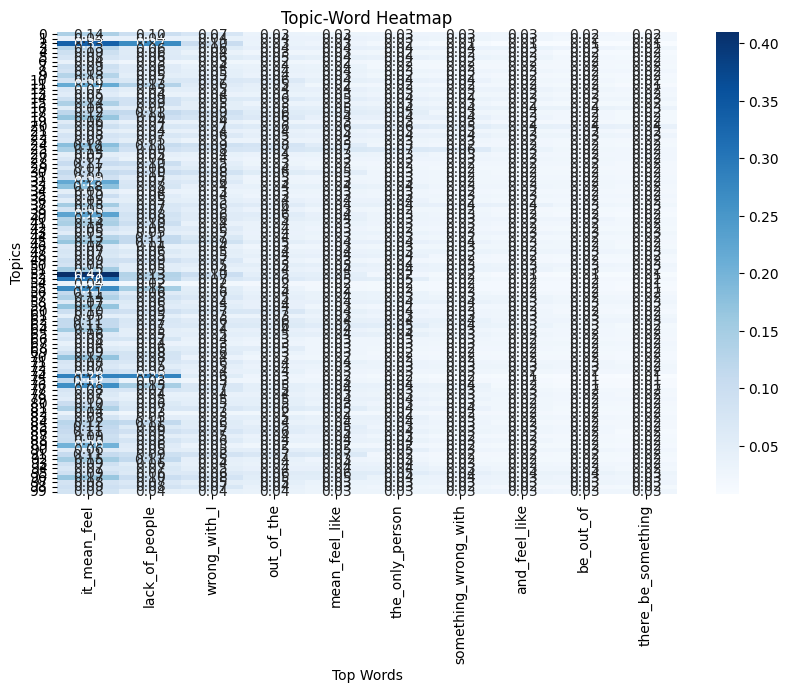

In [22]:
import seaborn as sns

# Function to plot the topic-word heatmap
def plot_topic_word_heatmap(model, num_words=10):
    # Get the number of topics from the model
    num_topics = model.num_topics

    # Create a matrix to store the topic-word probabilities
    topic_word_matrix = []
    for topic_num in range(num_topics):
        top_words = dict(model.show_topic(topic_num, num_words))
        topic_word_matrix.append(list(top_words.values()))

    # Create a heatmap to visualize the topic-word probabilities
    plt.figure(figsize=(10, 6))
    sns.heatmap(topic_word_matrix, cmap='Blues', xticklabels=top_words.keys(), yticklabels=range(num_topics), annot=True, fmt='.2f')
    plt.title('Topic-Word Heatmap')
    plt.xlabel('Top Words')
    plt.ylabel('Topics')
    plt.show()

# Call the function to plot the topic-word heatmap for the LDA model
plot_topic_word_heatmap(lda_model, num_words=10)

In [23]:
from tqdm import tqdm

num_topics = 50  # Define the number of topics you want
num_passes = 10  # Define the number of passes for updating the LDA model
progress_bar = tqdm(total=num_passes, desc="Training LDA")

# Initialize the LDA model with one initial pass and the specified number of topics
lda_model = gensim.models.LdaModel(doc_term_matrix, id2word=dictionary, passes=1, num_topics=num_topics)

# Perform additional passes to update the LDA model
for _ in range(num_passes):
    lda_model.update(doc_term_matrix)
    progress_bar.update(1)

progress_bar.close()

Training LDA: 100%|██████████| 10/10 [12:27<00:00, 74.76s/it]


In [24]:
# Extract topics and associated keywords
topics = lda_model.print_topics(num_topics=lda_model.num_topics)

In [25]:
# Assign meaningful labels to the identified topics based on dominant words
for topic in topics:
    print(topic)

(0, '0.122*"a_feeling_of" + 0.047*"be_a_feeling" + 0.046*"feeling_of_be" + 0.040*"it_be_a" + 0.031*"feeling_of_not" + 0.023*"be_there_for" + 0.022*"of_not_be" + 0.017*"share_my_thought" + 0.016*"there_for_you" + 0.016*"of_not_have"')
(1, '0.021*"to_to_who" + 0.021*"it_difficult_to" + 0.020*"family_or_friend" + 0.020*"who_you_can" + 0.020*"like_you_can" + 0.018*"to_be_there" + 0.017*"who_understand_I" + 0.016*"find_it_difficult" + 0.016*"to_do_anything" + 0.014*"if_you_need"')
(2, '0.034*"a_lot_of" + 0.021*"feel_in_a" + 0.021*"be_in_the" + 0.019*"lot_of_time" + 0.016*"it_do_not" + 0.014*"spend_a_lot" + 0.014*"mean_that_I" + 0.013*"and_I_have" + 0.013*"you_can_feel" + 0.012*"they_be_not"')
(3, '0.034*"of_other_people" + 0.033*"the_inability_to" + 0.030*"to_do_with" + 0.027*"do_something_with" + 0.022*"with_to_share" + 0.021*"low_self_esteem" + 0.018*"that_I_will" + 0.017*"in_some_way" + 0.016*"I_will_not" + 0.015*"will_not_be"')
(4, '0.024*"lack_of_support" + 0.021*"that_be_not" + 0.021*

In [26]:
# Visualize the topics using pyLDAvis

# Enable pyLDAvis for Jupyter Notebook or Jupyter Lab
pyLDAvis.enable_notebook()

# Prepare the visualization data using the trained LDA model, document-term matrix, and dictionary
vis = pyLDAvis.gensim.prepare(lda_model, doc_term_matrix, dictionary)

# Display the pyLDAvis visualization
pyLDAvis.display(vis)

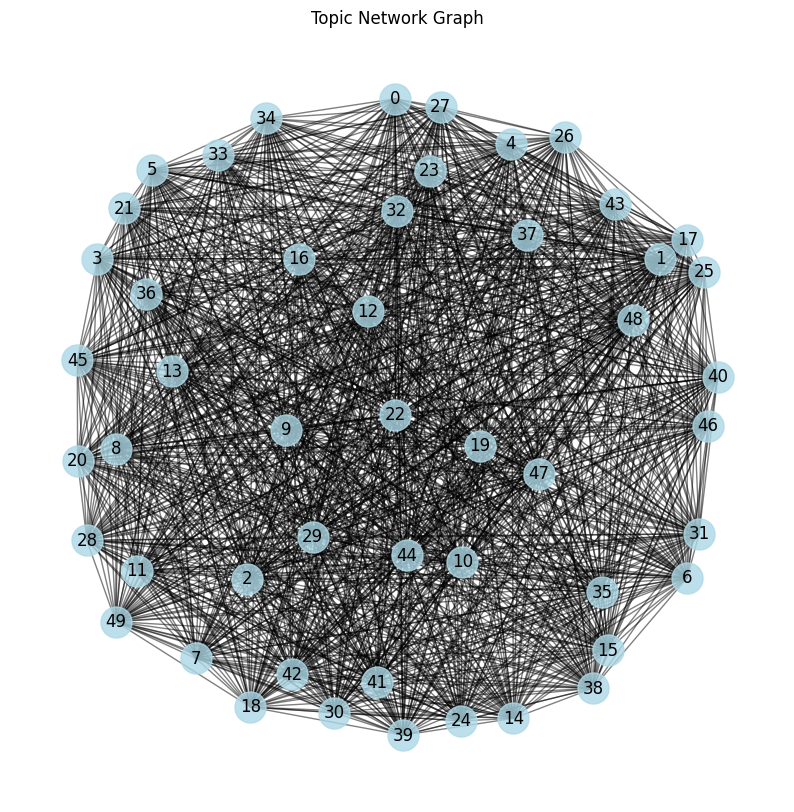

In [27]:
import networkx as nx
import matplotlib.pyplot as plt

# Function to plot topic network graph
def plot_topic_network(model):
    # Get the number of topics from the model
    num_topics = model.num_topics

    # Compute topic co-occurrence matrix normalized by row sums
    topic_cooccurrence = model.state.get_lambda()
    topic_cooccurrence /= topic_cooccurrence.sum(axis=1)[:, None]

    # Calculate topic similarity based on the co-occurrence matrix
    topic_similarity = topic_cooccurrence @ topic_cooccurrence.T

    # Create an empty graph
    G = nx.Graph()

    # Add nodes for each topic
    for i in range(num_topics):
        G.add_node(i)

    # Add edges between topics with non-zero similarity
    for i in range(num_topics):
        for j in range(i + 1, num_topics):
            similarity = topic_similarity[i, j]
            if similarity > 0:
                G.add_edge(i, j, weight=similarity)

    # Define node positions using the spring layout algorithm
    pos = nx.spring_layout(G, seed=42)

    # Create a figure and plot the network graph
    plt.figure(figsize=(10, 10))
    nx.draw_networkx_nodes(G, pos, node_color='lightblue', node_size=500, alpha=0.8)
    nx.draw_networkx_edges(G, pos, width=1.0, alpha=0.5)
    nx.draw_networkx_labels(G, pos, font_size=12, font_color='black')
    plt.axis('off')
    plt.title('Topic Network Graph')
    plt.show()

# Call the function to plot the topic network graph using the LDA model
plot_topic_network(lda_model)

In [28]:
import pyLDAvis
import pyLDAvis.gensim_models as gensimvis

# Prepare the visualization data
vis_data = gensimvis.prepare(lda_model, doc_term_matrix, dictionary)

# Display the visualization
pyLDAvis.display(vis_data)

In [35]:
pyLDAvis.save_html(vis_data, 'lda_visualization.html')

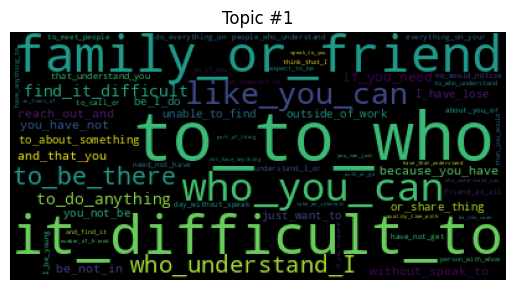

In [36]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

# Function to generate and display a word cloud for a specific topic
def plot_word_cloud_for_topic(lda_model, topic_num):
    """
    Generate and display a word cloud for a specific topic.

    Args:
        lda_model (gensim.models.ldamodel.LdaModel): The LDA model.
        topic_num (int): The topic number to visualize.

    Returns:
        None
    """
    # Create a word cloud using the top words from the specified topic
    wordcloud = WordCloud().fit_words(dict(lda_model.show_topic(topic_num, 200)))  # Assuming topic numbering starts from 0

    # Display the word cloud with a title
    plt.figure()
    plt.imshow(wordcloud)
    plt.axis("off")
    plt.title(f"Topic #{topic_num + 1}")  # Add 1 to match topic numbering starting from 1
    plt.show()

# Call the function to generate and display a word cloud for a specific topic (e.g., Topic #1)
plot_word_cloud_for_topic(lda_model, 0)  # Replace 0 with the desired topic number

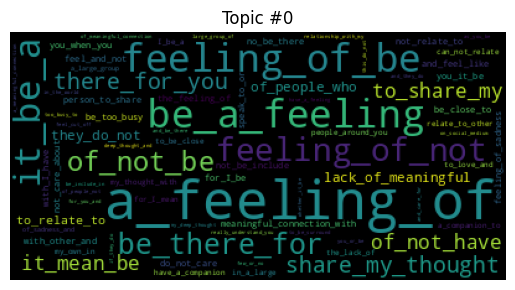

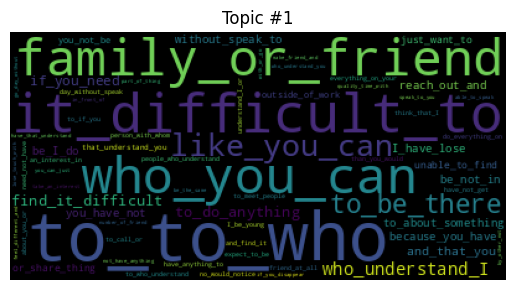

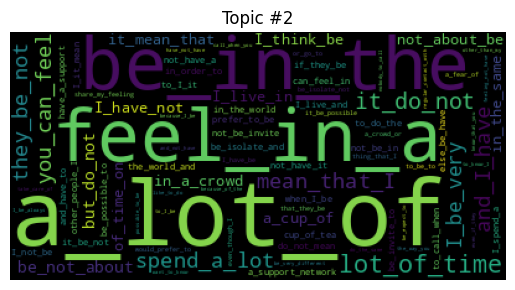

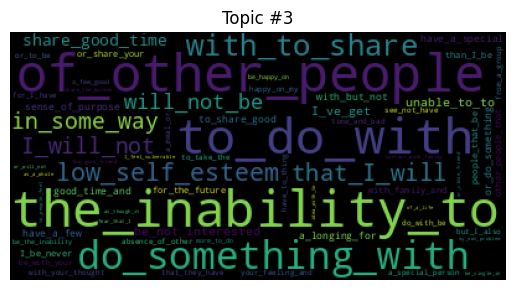

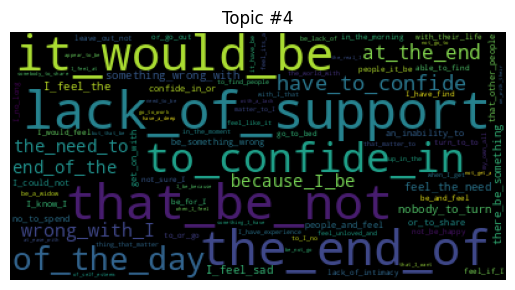

...

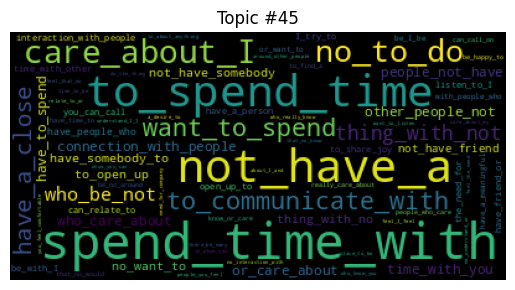

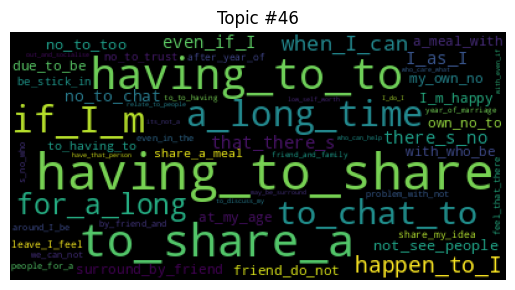

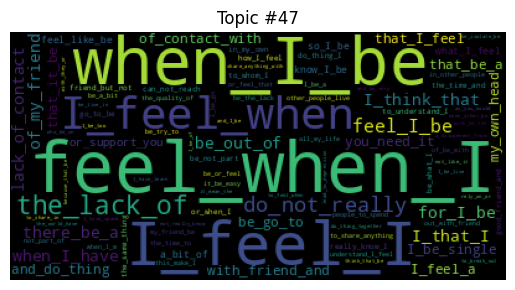

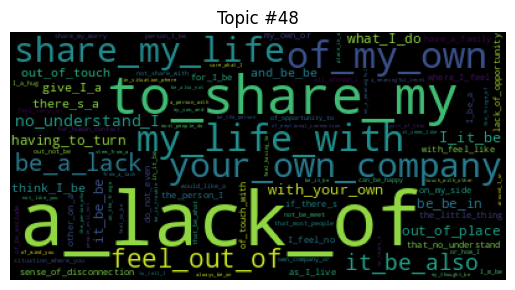

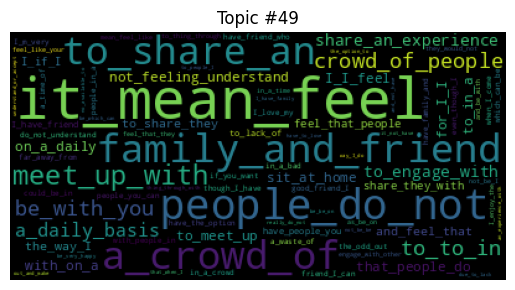

In [29]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

# Function to generate and display word clouds for each topic in an LDA model
def plot_word_clouds(lda_model, num_topics):
    """
    Generate and display word clouds for each topic in an LDA model.

    Args:
        lda_model (gensim.models.ldamodel.LdaModel): The LDA model.
        num_topics (int): The number of topics in the model.

    Returns:
        None
    """
    for t in range(num_topics):
        # Create a word cloud using the top words from the specified topic
        wordcloud = WordCloud().fit_words(dict(lda_model.show_topic(t, 200)))

        # Display the word cloud with a title
        plt.figure()
        plt.imshow(wordcloud)
        plt.axis("off")
        plt.title("Topic #" + str(t))
        plt.show()

# Call the function to generate and display word clouds for each topic in the LDA model
plot_word_clouds(lda_model, num_topics)

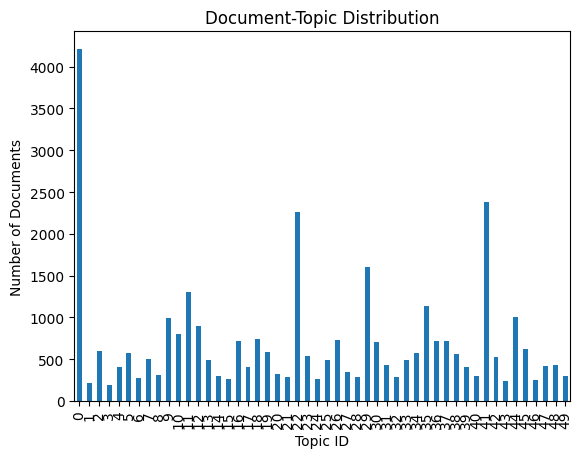

In [30]:
import pandas as pd

# Function to assign the dominant topic to each document and visualize document-topic distribution
def dominant_topic(lda_model, corpus):
    """
    Assign the dominant topic to each document in the corpus using an LDA model and visualize the document-topic distribution.

    Args:
        lda_model (gensim.models.ldamodel.LdaModel): The LDA model.
        corpus (list): The corpus in the form of a list of document-term frequency lists.

    Returns:
        list: A list of dominant topic IDs for each document.
    """
    doc_lda = lda_model[corpus]
    return [sorted(topics, key=lambda x: x[1], reverse=True)[0][0] for topics in doc_lda]

# Assign the dominant topic to each document and add it to the DataFrame
df['Dominant_Topic'] = dominant_topic(lda_model, doc_term_matrix)

# Visualize the document-topic distribution as a bar chart
doc_topic_dist = df['Dominant_Topic'].value_counts().sort_index().plot.bar()
plt.title('Document-Topic Distribution')
plt.xlabel('Topic ID')
plt.ylabel('Number of Documents')
plt.show()

In [38]:
pip install plotly

In [39]:
import pandas as pd
import plotly.express as px

def dominant_topic(lda_model, corpus):
    """
    Determine the dominant topic for each document.

    Parameters:
    - lda_model: The trained LDA model.
    - corpus: The document-term matrix.

    Returns:
    - A list of dominant topics for each document.
    """
    doc_lda = lda_model[corpus]
    return [sorted(topics, key=lambda x: x[1], reverse=True)[0][0] for topics in doc_lda]

df['Dominant_Topic'] = dominant_topic(lda_model, doc_term_matrix)

# Create an interactive bar chart using Plotly
topic_counts = df['Dominant_Topic'].value_counts().sort_index()
fig = px.bar(topic_counts, x=topic_counts.index, y=topic_counts.values, labels={'x': 'Topic ID', 'y': 'Number of Documents'}, title='Document-Topic Distribution')
fig.show()

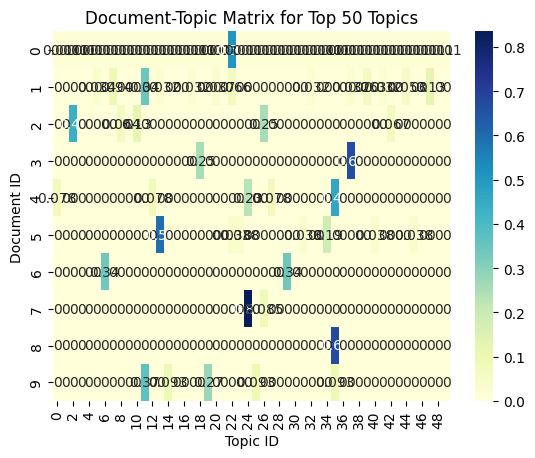

In [31]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

def document_topic_matrix(lda_model, corpus, num_docs=10, num_topics=50):
    """
    Create and visualize a document-topic matrix showing topic probabilities for each document.

    Args:
        lda_model (gensim.models.ldamodel.LdaModel): The LDA model.
        corpus (list): The corpus in the form of a list of document-term frequency lists.
        num_docs (int): The number of documents to include in the visualization.
        num_topics (int): The number of topics to include in the visualization.
    """
    # Create an empty matrix and fill it with topic probabilities
    doc_topic_dist = np.zeros((len(corpus), num_topics))
    for doc_num, doc in enumerate(lda_model[corpus]):
        for topic_id, topic_prob in doc:
            doc_topic_dist[doc_num, topic_id] = topic_prob

    doc_topic_df = pd.DataFrame(doc_topic_dist)
    sns.heatmap(doc_topic_df.iloc[:num_docs, :num_topics], cmap="YlGnBu", annot=True)
    plt.title(f"Document-Topic Matrix for Top {num_topics} Topics")
    plt.xlabel("Topic ID")
    plt.ylabel("Document ID")
    plt.show()

# Visualize the document-topic matrix for the LDA model and corpus
document_topic_matrix(lda_model, doc_term_matrix)

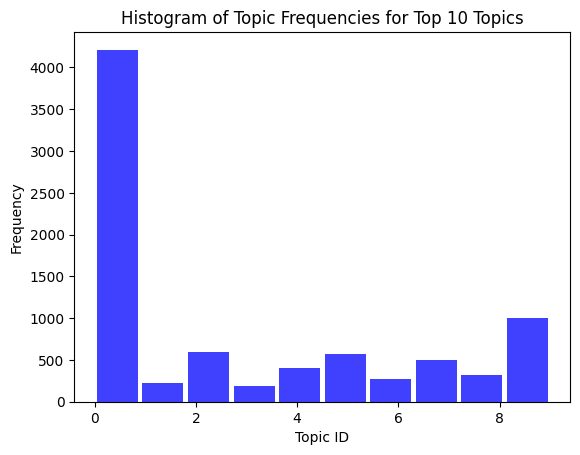

In [32]:
import matplotlib.pyplot as plt

def topic_frequency(lda_model, corpus, num_topics=10):
    """
    Visualize the frequency distribution of topics for the top N topics in the LDA model.

    Args:
        lda_model (gensim.models.ldamodel.LdaModel): The LDA model.
        corpus (list): The corpus in the form of a list of document-term frequency lists.
        num_topics (int): The number of top topics to include in the histogram.
    """
    # Extract the most probable topic for each document and filter by the specified number of topics
    topics = [sorted(doc, key=lambda x: -x[1])[0][0] for doc in lda_model[corpus] if sorted(doc, key=lambda x: -x[1])[0][0] < num_topics]

    # Plot a histogram of topic frequencies
    plt.hist(topics, bins=num_topics, alpha=0.75, rwidth=0.9, color='blue')
    plt.title(f'Histogram of Topic Frequencies for Top {num_topics} Topics')
    plt.xlabel('Topic ID')
    plt.ylabel('Frequency')
    plt.show()

# Visualize the topic frequency distribution for the LDA model and corpus
topic_frequency(lda_model, doc_term_matrix)

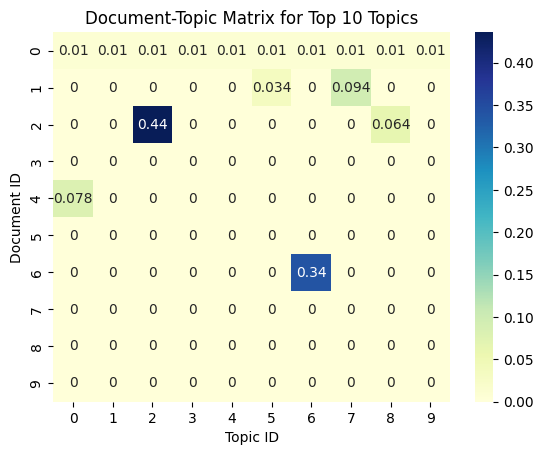

Topic 0:
	a_feeling_of (Prob: 0.122)
	be_a_feeling (Prob: 0.047)
	feeling_of_be (Prob: 0.046)
	it_be_a (Prob: 0.040)
	feeling_of_not (Prob: 0.031)
	be_there_for (Prob: 0.023)
	of_not_be (Prob: 0.022)
	share_my_thought (Prob: 0.017)
	there_for_you (Prob: 0.016)
	of_not_have (Prob: 0.016)
Topic 1:
	to_to_who (Prob: 0.021)
	it_difficult_to (Prob: 0.021)
	family_or_friend (Prob: 0.020)
	who_you_can (Prob: 0.020)
	like_you_can (Prob: 0.020)
	to_be_there (Prob: 0.018)
	who_understand_I (Prob: 0.017)
	find_it_difficult (Prob: 0.016)
	to_do_anything (Prob: 0.016)
	if_you_need (Prob: 0.014)
Topic 2:
	a_lot_of (Prob: 0.034)
	feel_in_a (Prob: 0.021)
	be_in_the (Prob: 0.021)
	lot_of_time (Prob: 0.019)
	it_do_not (Prob: 0.016)
	spend_a_lot (Prob: 0.014)
	mean_that_I (Prob: 0.014)
	and_I_have (Prob: 0.013)
	you_can_feel (Prob: 0.013)
	they_be_not (Prob: 0.012)
Topic 3:
	of_other_people (Prob: 0.034)
	the_inability_to (Prob: 0.033)
	to_do_with (Prob: 0.030)
	do_something_with (Prob: 0.027)
	with_to_s

In [33]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

def document_topic_matrix(lda_model, corpus, num_docs=10, num_topics=10):
    """
    Visualize the document-topic matrix for the top N topics in the LDA model.

    Args:
        lda_model (gensim.models.ldamodel.LdaModel): The LDA model.
        corpus (list): The corpus in the form of a list of document-term frequency lists.
        num_docs (int): The number of documents to include in the matrix visualization.
        num_topics (int): The number of top topics to include in the matrix visualization.
    """
    # Create an empty matrix and fill it with topic probabilities
    doc_topic_dist = np.zeros((len(corpus), num_topics))
    for doc_num, doc in enumerate(lda_model[corpus]):
        for topic_id, topic_prob in doc:
            if topic_id < num_topics:  # Only take the top N topics
                doc_topic_dist[doc_num, topic_id] = topic_prob

    doc_topic_df = pd.DataFrame(doc_topic_dist)
    sns.heatmap(doc_topic_df.iloc[:num_docs, :num_topics], cmap="YlGnBu", annot=True)
    plt.title(f"Document-Topic Matrix for Top {num_topics} Topics")
    plt.xlabel("Topic ID")
    plt.ylabel("Document ID")
    plt.show()

# Visualize the document-topic matrix for the LDA model and corpus
document_topic_matrix(lda_model, doc_term_matrix, num_docs=10, num_topics=10)

# Printing the top keywords for the top 10 topics
for topic_id in range(10):
    terms = lda_model.get_topic_terms(topic_id, 10)  # Get top 10 terms for each topic
    print(f"Topic {topic_id}:")
    for term_id, prob in terms:
        print(f"\t{dictionary[term_id]} (Prob: {prob:.3f})")

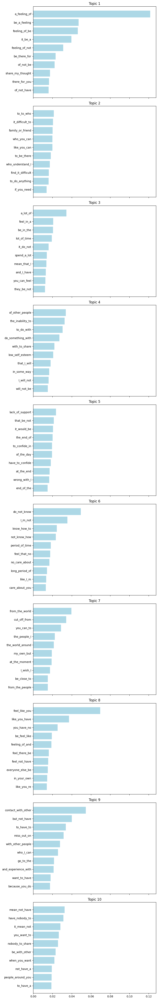

In [34]:
import matplotlib.pyplot as plt

def plot_top_words(model, num_topics=10, num_words=10):
    """
    Plot the top words for each topic in the LDA model.

    Args:
        model (gensim.models.ldamodel.LdaModel): The LDA model.
        num_topics (int): The number of top topics to include in the visualization.
        num_words (int): The number of top words to display for each topic.
    """
    fig, axs = plt.subplots(num_topics, 1, figsize=(8, num_topics*5), sharex=True)

    for topic_num in range(num_topics):  # This now iterates only over the top N topics
        top_words = model.show_topic(topic_num, num_words)
        top_words = dict(top_words)

        axs[topic_num].barh(range(num_words), list(top_words.values()), align='center', color='lightblue')
        axs[topic_num].set_yticks(range(num_words))
        axs[topic_num].set_yticklabels(top_words.keys())
        axs[topic_num].invert_yaxis()
        axs[topic_num].set_title(f"Topic {topic_num + 1}")

    plt.tight_layout()
    plt.show()

# Call the function to plot top words for each topic (top 10 topics and top 10 words)
plot_top_words(lda_model, num_topics=10, num_words=10)

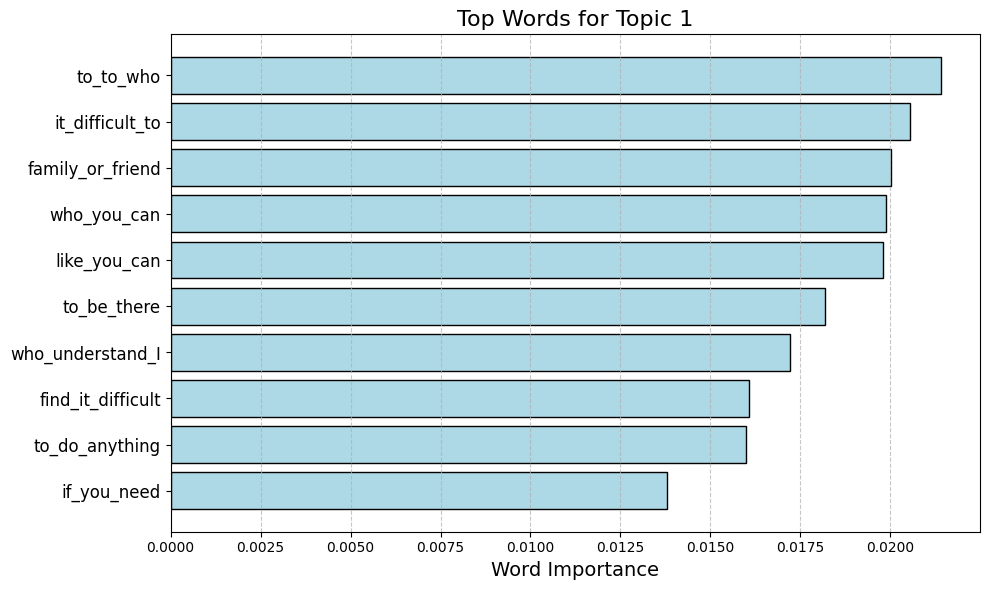

In [41]:
import matplotlib.pyplot as plt

def plot_top_words_for_topic_1(model, num_words=10):
    """
    Plot the top words for Topic 1 in the LDA model.

    Args:
        model (gensim.models.ldamodel.LdaModel): The LDA model.
        num_words (int): The number of top words to display for Topic 1.
    """
    fig, ax = plt.subplots(figsize=(10, 6))  # Adjust figure size for better presentation

    # Get top words for Topic 1
    top_words = model.show_topic(1, num_words)  # Assuming topic numbering starts from 0
    top_words = dict(top_words)

    # Create a horizontal bar chart
    ax.barh(range(num_words), list(top_words.values()), align='center', color='lightblue', edgecolor='black')
    ax.set_yticks(range(num_words))
    ax.set_yticklabels(top_words.keys(), fontsize=12)
    ax.invert_yaxis()
    ax.set_title(f"Top Words for Topic 1", fontsize=16)
    ax.set_xlabel("Word Importance", fontsize=14)
    ax.grid(axis='x', linestyle='--', alpha=0.7)

    plt.tight_layout()
    plt.show()

# Call the function to plot top words for Topic 1 (top 10 words)
plot_top_words_for_topic_1(lda_model, num_words=10)